In [ ]:
import pandas as pd
import numpy as np
import os
import sys
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LassoCV
import shap
import matplotlib.pyplot as plt

# Define the current directory if __file__ is not available
current_dir = os.getcwd()  # Gets the current working directory
parent_dir = os.path.abspath(os.path.join(current_dir, '..'))  # Moves one level up

# Add the parent directory to the Python path
sys.path.insert(0, parent_dir)

from save_and_compare_results import *


In [ ]:
# Define the path to the parent directory
data_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))  # Move one level up

# Load the preprocessed data
X = pd.read_pickle(os.path.join(data_dir, "data/X_matrix_proteins_nb.pkl"))
Y = pd.read_pickle(os.path.join(data_dir, "data/Y_matrix_proteins_nb.pkl"))

In [3]:
# Preprocess the data
X = X.drop(columns=["Yeast_ID"]).fillna(0)
Y = Y.drop(columns=["Yeast_ID"]).fillna(Y.drop(columns=["Yeast_ID"]).mean())

In [4]:
# Define the hyperparameter grid
param_distributions = {
    "learning_rate": np.logspace(-3, 0, 3),  # Learning rates from 0.001 to 1
    "n_estimators": [100, 500],   # Number of boosting rounds
    "num_leaves": [50, 100],        # Number of leaves in one tree
    "max_depth": [10, 30],           # Tree depth (-1 means no limit)
    "subsample": [0.7, 0.9],       # Subsampling ratio
    "colsample_bytree": [0.5, 0.8],# Feature fraction for tree building
    "reg_alpha": [0.1, 1.0],      # L1 regularization
    "reg_lambda": [0.1, 1.0, 10.0]      # L2 regularization
}

In [5]:
# Initialize the LightGBM regressor
lgbm = LGBMRegressor(random_state=42)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=param_distributions,
    n_iter=100,                # Number of parameter settings sampled
    cv=5,                      # 5-fold cross-validation
    scoring="r2",              # Metric to optimize (can use "neg_mean_squared_error" for regression)
    verbose=2,                 # Display progress
    n_jobs=-1,                 # Use all available cores
    random_state=42
)

In [6]:
# Fit RandomizedSearchCV to the entire dataset
print("Running hyperparameter tuning...")
random_search.fit(X, Y.values.ravel())

Running hyperparameter tuning...
Fitting 5 folds for each of 100 candidates, totalling 500 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.372337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 64198
[LightGBM] [Info] Number of data points in the train set: 634, number of used features: 8704
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.953083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Start training from score -0.046825
[LightGBM] [Info] Total Bins 66014
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.988885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 66686
[LightGBM] [Info] Number of data points in the train set: 633, number of used features: 8793
[LightGBM

/Users/claradelandre/opt/anaconda3/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 2.034701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Total Bins 66686
[LightGBM] [Info] Number of data points in the train set: 633, number of used features: 8867
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score -0.038461
[LightGBM] [Warning] No further splits with positive gain, best gai

RandomizedSearchCV(cv=5, estimator=LGBMRegressor(random_state=42), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.5, 0.8],
                                        'learning_rate': array([0.001     , 0.03162278, 1.        ]),
                                        'max_depth': [10, 30],
                                        'n_estimators': [100, 500],
                                        'num_leaves': [50, 100],
                                        'reg_alpha': [0.1, 1.0],
                                        'reg_lambda': [0.1, 1.0, 10.0],
                                        'subsample': [0.7, 0.9]},
                   random_state=42, scoring='r2', verbose=2)

In [7]:
# Get the best model and parameters
best_lgbm = random_search.best_estimator_
best_params = random_search.best_params_
print("\nBest hyperparameters:", best_params)


Best hyperparameters: {'subsample': 0.7, 'reg_lambda': 10.0, 'reg_alpha': 1.0, 'num_leaves': 100, 'n_estimators': 100, 'max_depth': 10, 'learning_rate': 0.03162277660168379, 'colsample_bytree': 0.5}


Best hyperparameters for binary dataset of proteins :   
{'subsample': 0.7, 'reg_lambda': 10.0, 'reg_alpha': 1.0, 'num_leaves': 100, 'n_estimators': 100, 'max_depth': 30, 'learning_rate': 0.03162277660168379, 'colsample_bytree': 0.8}   
R² Score: 0.5751, Mean Squared Error: 0.0213  
   

Best hyperparameters for number dataset of proteins :   
Best hyperparameters: {'subsample': 0.7, 'reg_lambda': 10.0, 'reg_alpha': 1.0, 'num_leaves': 100, 'n_estimators': 100, 'max_depth': 10, 'learning_rate': 0.03162277660168379, 'colsample_bytree': 0.5}  
R² Score: 0.5890, Mean Squared Error: 0.0206

In [8]:
# Evaluate the best model
y_pred = best_lgbm.predict(X)
r2 = r2_score(Y, y_pred)
mse = mean_squared_error(Y, y_pred)
print(f"\nR² Score: {r2:.4f}, Mean Squared Error: {mse:.4f}")


R² Score: 0.5890, Mean Squared Error: 0.0206


# model features importance

In [9]:
# Save feature importance from LightGBM
print("Saving LightGBM feature importances...")
save_feature_importance(
    features=X.columns,
    importance_scores=best_lgbm.feature_importances_,
    method="model",
    model_name="LightGBM"
)

Saving LightGBM feature importances...
Feature importance saved to results/LightGBM_model_importance.csv


Affichage des 10 caractéristiques les plus importantes...

Mutations ayant le plus d'impact sur le YPD doubling time :
             Feature  Importance
11286    YNL170W_CNV          22
556          YBR291C          22
10341      YLR154W-F          17
2583         YGR256W          16
4949       YMR316C-A          14
10642        YLR467W          13
10653  YML009C-A_CNV          12
6584     YAR035W_CNV          12
122        YBL006W-A          12
6591     YAR068W_CNV          11


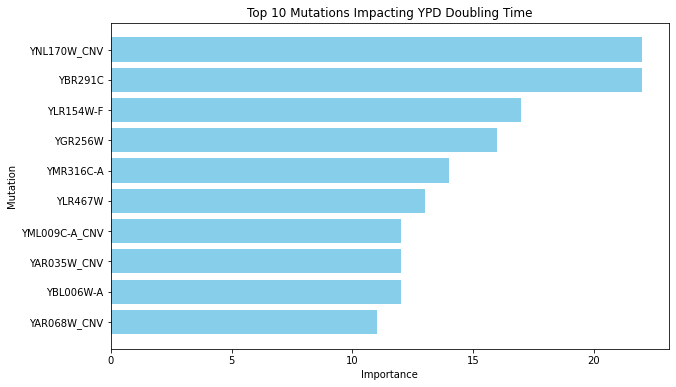

In [10]:
# Afficher et tracer les 10 caractéristiques les plus importantes
print("Affichage des 10 caractéristiques les plus importantes...")
feature_importances_df = pd.DataFrame({
    "Feature": X.columns,
    "Importance": best_lgbm.feature_importances_
}).sort_values(by="Importance", ascending=False)

# Sélectionner les 10 caractéristiques les plus importantes
top_mutations = feature_importances_df.head(10)

# Afficher dans la console
print("\nMutations ayant le plus d'impact sur le YPD doubling time :")
print(top_mutations)

# Créer le graphique
plt.figure(figsize=(10, 6))
plt.barh(top_mutations["Feature"], top_mutations["Importance"], color="skyblue")
plt.xlabel("Importance")
plt.ylabel("Mutation")
plt.title("Top 10 Mutations Impacting YPD Doubling Time")
plt.gca().invert_yaxis()
plt.show()

# SHAP importances

In [11]:
# SHAP analysis
print("Calculating SHAP values...")
explainer = shap.Explainer(best_lgbm, X)
shap_values = explainer(X)
shap_mean_importance = np.abs(shap_values.values).mean(axis=0)

# Save SHAP feature importance
print("Saving SHAP feature importances...")
save_feature_importance(
    features=X.columns,
    importance_scores=shap_mean_importance,
    method="SHAP",
    model_name="LightGBM"
)

Calculating SHAP values...
Saving SHAP feature importances...
Feature importance saved to results/LightGBM_SHAP_importance.csv


Generating SHAP plots...


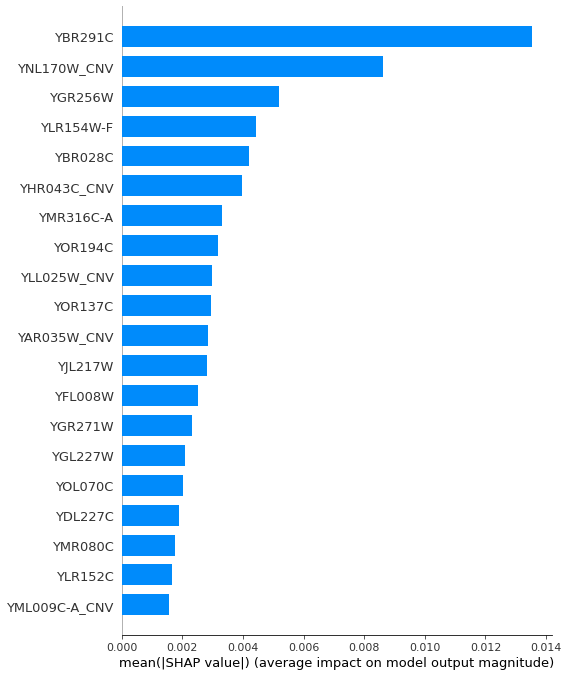

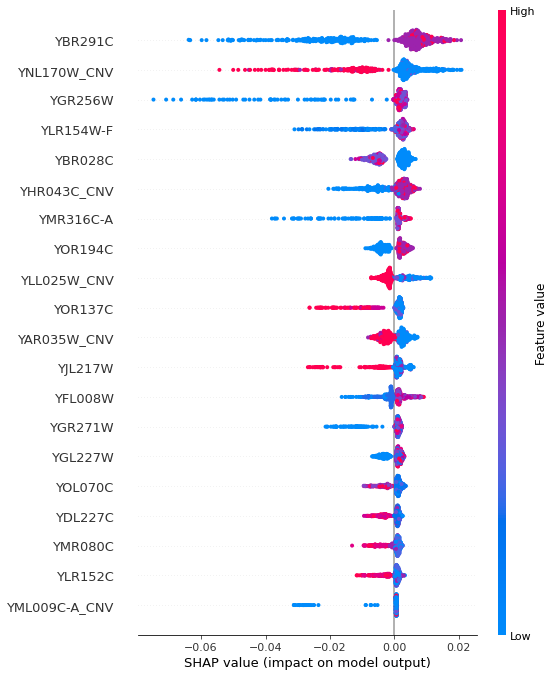

In [12]:
# Generate SHAP summary plots
print("Generating SHAP plots...")
shap.summary_plot(shap_values, X, plot_type="bar")
shap.summary_plot(shap_values, X)

--- after : not necessary

# LASSO regression features importance

In [39]:
# Lasso Regression
print("Running Lasso Regression...")
lasso = LassoCV(cv=5, random_state=42)
lasso.fit(X, Y.values.ravel())

# Save Lasso feature importance
print("Saving Lasso feature importances...")
save_feature_importance(
    features=X.columns,
    importance_scores=lasso.coef_,
    method="Lasso",
    model_name="Lasso"
)

Running Lasso Regression...


/Users/claradelandre/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.733e-03, tolerance: 2.643e-03
  model = cd_fast.enet_coordinate_descent(
/Users/claradelandre/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.862e-03, tolerance: 2.643e-03
  model = cd_fast.enet_coordinate_descent(
/Users/claradelandre/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider

Saving Lasso feature importances...
Feature importance saved to results/Lasso_Lasso_importance.csv


# Compare feature importances across models

In [ ]:
print("Comparing feature importances across methods...")
summary = compare_feature_importances("results/*.csv", top_n=20)
summary.to_csv("results/feature_comparison_summary.csv", index=False)
print(summary.head())

# Plot the top recurrent features
print("Plotting top recurrent features...")
plot_feature_frequencies(summary)